# Implemented Algorithms and Function

These functions: routines and algorithms are used throughout this notebook for computation and statistical plotting.

The computational / statistical algorithms and the parameters used are inspired from Poldrack, R., Mumford, J., & Nichols, T. (2011). *Handbook of Functional MRI Data Analysis*. Cambridge: Cambridge University Press. and  F., Gregory Ashby. (2019). *Statistical Analysis of fMRI Data*. MIT Press.



#### Imports

In [69]:
from warnings import filterwarnings
filterwarnings('ignore')
import numpy as np
import pandas as pd
from numpy import array
import matplotlib.pyplot as plt


import gzip, shutil
import time
import yaml
import glob

from nilearn import image, plotting
from nilearn.plotting import plot_stat_map
from nilearn.image import concat_imgs, mean_img
from nistats.design_matrix import make_first_level_design_matrix
from nistats.first_level_model import FirstLevelModel
from nistats.second_level_model import SecondLevelModel
from nilearn.plotting import plot_roi
from nilearn.masking import compute_background_mask
from nilearn.image import threshold_img



from nilearn.image import math_img
from nilearn import input_data
from nilearn.input_data import NiftiMasker

from nistats.reporting import plot_design_matrix,plot_contrast_matrix
from nistats.thresholding import map_threshold
from nistats.reporting import get_clusters_table
from nistats.experimental_paradigm import check_events

from sklearn.feature_selection import f_classif, mutual_info_classif, SelectFdr

from sklearn.feature_selection import GenericUnivariateSelect
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier        
    
%matplotlib inline

## GLM

In [3]:
def compute_core_fmri_glm(task,
                          data_path,
                          events_path,
                          motion_param_path,
                          cache_mem_path,
                          analysis_type,
                          param_modulation,
                          t_r,
                          slice_time_ref,
                          hrf_model,
                          drift_model,
                          drift_order,
                          fbr_expected_tr_delay,
                          pre_whitening_spec,
                          apply_trans_mask,
                          roi_img,
                          hpf_cut,
                          smoothing_fwhm,
                          standardize,
                          detrend,minimize_memory):
    
                          
                          
    # Data processing                      

    data = image.load_img(data_path)
    m_img = mean_img(data) # mean niimg for plotting purposes
    motion = pd.read_csv(motion_param_path,sep=',',header=None)
    motion = motion[list(range(1,7))]
    motion_col = ['tx', 'ty', 'tz', 'rx', 'ry', 'rz']
    motion.columns = motion_col



    #Experimental Paradigm Processing

    events = pd.read_csv(events_path,sep='\t')
    events.columns = ['onset','duration','trial_type','modulation']
    events.dropna(inplace=True)
    events.index = range(len(events))
    
    
    
    if analysis_type == 'High_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=50 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            


    elif analysis_type == 'High_Mid_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=67 else 'Mid Pleasance' if x>=34 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            
    
    # Design Matrix Computation + plotting
    
    frametimes = np.linspace(0, (data.shape[3] - 1) * t_r, data.shape[3])
    
    fir_delays = list(range(1,fbr_expected_tr_delay+1)) if fbr_expected_tr_delay != None else None
    
    design_matrix = make_first_level_design_matrix(frametimes,
                       events=events,
                       add_regs=motion,
                       add_reg_names=motion_col,
                       hrf_model=hrf_model,
                       drift_model= drift_model,
                       fir_delays= fir_delays, 
                       drift_order =drift_order)
    
    plot_design_matrix(design_matrix)
    
    # Statistically Enhancing Mask Computation
    
    if apply_trans_mask:
    
    
        masker = input_data.NiftiMasker(mask_img=roi_img,smoothing_fwhm=smoothing_fwhm,
                                standardize=standardize,detrend=detrend,
                                high_pass=hpf_cut,t_r=t_r).fit(data)
      
    else :
        
        masker = input_data.NiftiMasker(mask_img=roi_img).fit(data)
        
        
        
    # GLM instantiation and fit
    
    glm = FirstLevelModel(t_r=t_r,
                      slice_time_ref=slice_time_ref,
                      mask_img=masker,
                      noise_model= pre_whitening_spec,
                      high_pass=hpf_cut,
                      smoothing_fwhm = smoothing_fwhm,
                      standardize=standardize,
                      memory=cache_mem_path,
                      minimize_memory=minimize_memory, 
                      verbose=1)

    glm = glm.fit(data,design_matrices=design_matrix)
    
    return glm, design_matrix

## Statistical Plotting

In [4]:
def top_cluster_stat_results(data,task,glm,z_map,threshold,table,bg_img):
    
    # Top Cluster Selection + Masking
    coords = table.loc[range(1, 7), ['X', 'Y', 'Z']].values
    masker = input_data.NiftiSpheresMasker(coords,standardize=True)
    real_timeseries = masker.fit_transform(data)
    predicted_timeseries = masker.fit_transform(glm.predicted[0])

    
    


    # PLOT 1
    fig1, axs1 = plt.subplots(2, 3)
    for i in range(0, 3):
        axs1[0, i].set_title(' Top {} Activated Cluster \n(cluster peak voxel at coord {})'.format(i+1,coords[i]))
        axs1[0, i].plot(real_timeseries[:, i], c='blue', lw=2,label = 'Actual Bold Signal')
        axs1[0, i].plot(predicted_timeseries[:, i], c='r',  ls='-', lw=2,label= 'Predicted Bold Signal')
        axs1[0, i].set_xlabel('Time')
        axs1[0, i].set_ylabel('Signal intensity', labelpad=0)
        axs1[0, i].legend()
        roi_img = plotting.plot_stat_map(
            z_map, cut_coords=[coords[i][2]], threshold=threshold, figure=fig1,
            axes=axs1[1, i], display_mode='z', colorbar=False, bg_img=bg_img,title='{} Task : Low Pleasance (fdr=0.05, threshold = {})'.format(task,threshold))
        roi_img.add_markers([coords[i]], 'green', 300)
    fig1.set_size_inches(50, 19)
    plt.show()


    #PLOT 2
    fig2, axs2 = plt.subplots(2, 3)
    for i in range(3, 6):
        axs2[0, i-3].set_title(' Top {} Activated Cluster \n(cluster peak voxel at coord {})'.format(i+1,coords[i]))
        axs2[0, i-3].plot(real_timeseries[:, i], c='blue', lw=2,label = 'Actual Bold Signal')
        axs2[0, i-3].plot(predicted_timeseries[:, i], c='r',  ls='-', lw=2,label= 'Predicted Bold Signal')
        axs2[0, i-3].set_xlabel('Time')
        axs2[0, i-3].set_ylabel('Signal intensity', labelpad=0)
        axs2[0, i-3].legend()
        roi_img = plotting.plot_stat_map(
            z_map, cut_coords=[coords[i][2]], threshold=threshold, figure=fig2,
            axes=axs2[1, i-3], display_mode='z', colorbar=False, bg_img=bg_img,title='{} Task : Low Pleasance (fdr=0.05, threshold = {})'.format(task,threshold))
        roi_img.add_markers([coords[i]], 'green', 300)
    fig2.set_size_inches(50, 19)
    plt.show()

        

In [5]:
def stat_result(z_map,contrast_name,task,alpha,method,bg_img):
    
    _, threshold = map_threshold(z_map, alpha=alpha, height_control=method)
    table = get_clusters_table(z_map, stat_threshold=threshold)
    plot_stat_map(z_map, bg_img=bg_img, threshold=threshold,
                   black_bg=True,
                  title='{} Task : {} ({}={}, threshold = {})'.format(task,contrast_name,method,alpha,threshold))
    plt.show()
    return table, threshold

## MVPA

In [6]:
def fbr_separate_method_comp(task,
                          data_path,
                          events_path,
                          motion_param_path,
                          cache_mem_path,
                          activity_mat_saving_path,
                          analysis_type,
                          param_modulation,
                          t_r,
                          drift_model,
                          drift_order,
                          fbr_expected_tr_delay,
                          pre_whitening_spec,
                          apply_trans_mask,
                          roi_img,  
                          hpf_cut,
                          smoothing_fwhm,
                          standardize,
                          detrend,minimize_memory):
    
    
    output_activity_matrices = dict()                          
    # Data processing                      

    data = image.load_img(data_path)
    m_img = mean_img(data) # mean niimg for plotting purposes
    motion = pd.read_csv(motion_param_path,sep=',',header=None)
    motion = motion[list(range(1,7))]
    motion_col = ['tx', 'ty', 'tz', 'rx', 'ry', 'rz']
    motion.columns = motion_col


    #Experimental Paradigm Processing

    events = pd.read_csv(events_path,sep='\t')
    events.columns = ['onset','duration','trial_type','modulation']
    events.dropna(inplace=True)
    events.index = range(len(events))
    
    
    
    if analysis_type == 'High_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=50 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            


    elif analysis_type == 'High_Mid_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=67 else 'Mid Pleasance' if x>=34 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            
            
            
    #  FBR - Separate event matrices computation

    
    mvpa_events_labels= list()
    for i in range(len(events['trial_type'])):
    
        mvpa_event_label = events['trial_type'][i]

        vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)] = events.copy()

        mvpa_events_labels.append('{}_{}'.format(mvpa_event_label.replace(' ',''),i+1))

        trial_type_treated = ['{}_{}'.format(mvpa_event_label,i+1) if k == i else 'Nuisance Event' for k in  range(len(events['trial_type']))]

        vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)]['trial_type'] = trial_type_treated



        print('Event {}'.format(i))
        print(vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)])
            
    # Multiple GLM fit
    
    
    for mvpa_label in mvpa_events_labels:
        print('GLM RUN {}'.format(mvpa_label))
        
        # Design Matrix Computation + plotting
        
        frametimes = np.linspace(0, (data.shape[3] - 1) * t_r, data.shape[3])
    
        fir_delays = list(range(1,fbr_expected_tr_delay+1)) if fbr_expected_tr_delay != None else None
    

        design_matrix = make_first_level_design_matrix(frametimes,
                           events=vars()['events_{}'.format(mvpa_label)],
                           add_regs=motion,
                           add_reg_names=motion_col,
                           hrf_model='fir',
                           fir_delays = fir_delays,
                           drift_model= drift_model,
                           drift_order =drift_order)

        plot_design_matrix(design_matrix)

        # Statistically Enhancing Mask Computation

        if apply_trans_mask :
    
    
            masker = input_data.NiftiMasker(mask_img=roi_img,smoothing_fwhm=smoothing_fwhm,
                                standardize=standardize,detrend=detrend,
                                high_pass=hpf_cut,t_r=t_r).fit(data)
      
        else :
        
            masker = input_data.NiftiMasker(mask_img=roi_img).fit(data)


        # GLM instantiation and fit

        glm = FirstLevelModel(t_r=t_r,
                          mask_img=masker,
                          noise_model= pre_whitening_spec,
                          high_pass=hpf_cut,
                          smoothing_fwhm = smoothing_fwhm,
                          standardize=standardize,
                          memory=cache_mem_path,
                          minimize_memory=minimize_memory, 
                          verbose=1)

        glm = glm.fit(data,design_matrices=design_matrix)
        
    
    
        design_matrix = glm.design_matrices_[0]
        plot_design_matrix(design_matrix)
        plt.title('Design Matrix')
        plt.show()

        masker = NiftiMasker()

        vars()['{}_activity_matrix'.format(mvpa_label)] = pd.DataFrame(None)

        for i in range(fbr_expected_tr_delay):
            condition_delay = np.eye(N=1,M=len(design_matrix.columns),k=i)
            plot_contrast_matrix(condition_delay,design_matrix=design_matrix)
            z_map = glm.compute_contrast(condition_delay,
                                      stat_type='t',
                                      output_type='z_score')
            masked_map = masker.fit_transform(z_map)

            vars()['{}_activity_matrix'.format(mvpa_label)] = vars()['{}_activity_matrix'.format(mvpa_label)].append(pd.DataFrame(masked_map))



        print('ACTIVITY MATRIX {}'.format(mvpa_label))
                                         
        if activity_mat_saving_path != None:
                                         
            vars()['{}_activity_matrix'.format(mvpa_label)].to_csv('{}{}_activity_matrix.csv'.format(activity_mat_saving_path,mvpa_label)) 
        
                                         
                                         
    # Control Standardization
                                         
                                         
                                         
    if analysis_type == 'High_Low_Pleasance':

        HP_activity_matrix = list()
        LP_activity_matrix = list()
        
                                         
        for mvpa_label in mvpa_events_labels:
                                         
            if mvpa_label[0] == 'H':
                HP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            else:
                LP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
         
        for label in ['HP','LP'] :
             
            activity_matrix = np.stack(vars()['{}_activity_matrix'.format(label)],axis=2)
             
                                         
                                         
            activity_matrix_dim_voxel_mean = activity_matrix.mean(axis=2)
            activity_matrix_dim_voxel_std = activity_matrix.std(axis=2)


            activity_matrix_dim_voxel_mean.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)
            activity_matrix_dim_voxel_std.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)


            activity_matrix_c_standardized = (activity_matrix - activity_matrix_dim_voxel_mean)/activity_matrix_dim_voxel_std
                                         
            output_activity_matrices[label] = activity_matrix_c_standardized
                                         
            
            
                                         
    elif analysis_type == 'High_Mid_Low_Pleasance':
                                         
                                         
        
        HP_activity_matrix = list()
        MP_activity_matrix = list() 
        LP_activity_matrix = list()
        
        for mvpa_label in mvpa_events_labels:
            if mvpa_label[0] == 'H':
                HP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            elif mvpa_label[0] == 'M' :
                MP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            else:
                LP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)]) 
                                         
         
        for label in ['HP','LP'] :
             
            activity_matrix = np.stack(vars()['{}_activity_matrix'.format(label)],axis=2)
             
                                         
                                         
            activity_matrix_dim_voxel_mean = activity_matrix.mean(axis=2)
            activity_matrix_dim_voxel_std = activity_matrix.std(axis=2)


            activity_matrix_dim_voxel_mean.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)
            activity_matrix_dim_voxel_std.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)


            activity_matrix_c_standardized = (activity_matrix - activity_matrix_dim_voxel_mean)/activity_matrix_dim_voxel_std
                                         
            output_activity_matrices[label] = activity_matrix_c_standardized
                                         
                
    # Feature Matrix and Label Vector Computation    
                
    label_vect = list()
    
    for label in output_activity_matrices.keys():
        vec = np.array([label for i in range(output_activity_matrices[label].shape[2])])
        vec.shape = (output_activity_matrices[label].shape[2],1)
        label_vect.append(vec)
        
    y = np.vstack(label_vect)
    
    features_mat = list()

    for label in output_activity_matrices.keys():
        mat = output_activity_matrices[label].copy()
        features_mat.append(mat.reshape(mat.shape[0]*mat.shape[1],mat.shape[2]).T)



    X = np.vstack(features_mat)
        
    
    return  y, X

# I/O

#### Preferences Paradigm Dataset Variables

In [7]:
subject_id = ['01','04','05','06']
ses_id = ['19','15']
n_run_per_task = 2
tasks = ['Houses','Food','Faces','Paintings']
path = 'dataset/'
experiment_data = dict()

####  Preprocessed Experiment Data Files Paths Extraction

In [8]:
for sub in subject_id:
    
    experiment_data[sub] = {'Houses':None,'Food':None, 'Faces':None, 'Paintings':None}
    
    for task in tasks:
        
        experiment_data[sub][task] = {'ap':None,'pa':None}
        
        for direc in ['ap','pa']:
            
            experiment_data[sub][task][direc] = {'nii':None, 'motion_param':None, 'events':None}
            
            experiment_data[sub][task][direc]['nii'] = [f for f in glob.glob(path + "**/ra*func_sub-{}*{}*{}*.nii".format(sub,task,direc), recursive=True)][0]
            experiment_data[sub][task][direc]['motion_param'] = [f for f in glob.glob(path + "**/rp*func_sub-{}*{}*{}*.txt".format(sub,task,direc), recursive=True)][0]
            experiment_data[sub][task][direc]['events'] = [f for f in glob.glob(path + "**/*func_sub-{}*{}*{}*.tsv".format(sub,task,direc), recursive=True)][0]
            
            


####   Preprocessed Experiment Data

In [9]:
print(yaml.dump(experiment_data))

'01':
  Faces:
    ap:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_bold.nii
    pa:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.nii
  Food:
    ap:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir-ap_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir-ap_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir

## Global  Statistical Computation Parameters

In [10]:
voxel_dim = 1.5
t_r = 2
pre_whitening_spec = 'ar1'
smoothing_fwhm = 2*voxel_dim 
slice_time_ref = 0. # Matching with STC done in preproc
cache_mem_path = 'cache_mem/'

# First Level Analysis

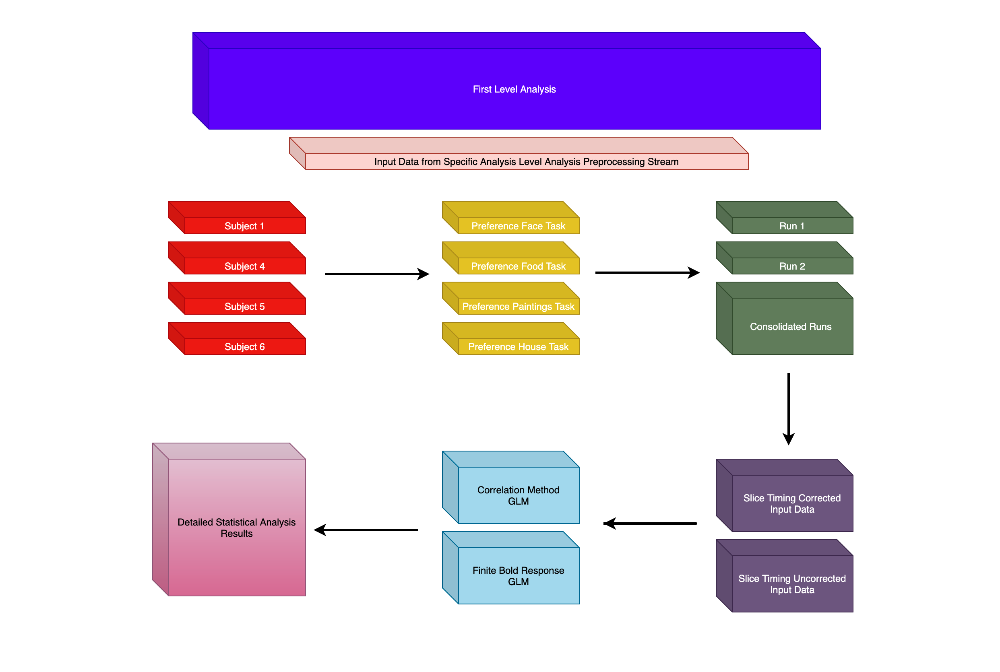

# Modelling Strategy

Unless notified otherwise, GLMs are fitted using all or a subset of the following specifications:

  - Glover haemodynamic response function / Finite Impulse Response
  - Derivative
  - Dispersion
  - High pass filtering
  - Prewhitening
  - Drift
  - Motion regressors
  
Moreover, the data is smoothed just before statistical processing.

## Subject 1

### Face Task

#### Run 1 AP 

In [10]:
# (Subject,Task,Run) specific parameters

data_path = experiment_data['01']['Faces']['ap']['nii']
events_path = experiment_data['01']['Faces']['ap']['events']
motion_param_path = experiment_data['01']['Faces']['ap']['motion_param']



task = 'Faces'
events = pd.read_csv(events_path,sep='\t')

onset_periods = [events['onset'][i+1] - events['onset'][i]  for i in range(len(events['onset']))if (i<len(events['onset'])-1)]
onset_periods = np.array(onset_periods)
onset_freq = np.reciprocal(onset_periods)
hpf_cut = np.min(onset_freq)/2 # cf High Pass Filtering Rule of Thumb ( fMRI Handbook 2011)



##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

In [ ]:
# PARAMETRIC MODULATION RELEVANCE EVALUATION ( only on HIGH Pleasantness vs LOW Pleasantness)

hrf_model = 'spm'

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_ap_cor, design_mat_01_Faces_ap_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Low_Pleasance',
                          param_modulation= True,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=None,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [13]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))

conditions = {
'high_p': np.eye(N=1,M=len(design_mat_01_Faces_ap_cor.columns),k=0),
'low_p' :np.eye(N=1,M=len(design_mat_01_Faces_ap_cor.columns),k=1),    
'Task_related':np.eye(N=1,M=len(design_mat_01_Faces_ap_cor.columns),k=0)+np.eye(N=1,M=len(design_mat_01_Faces_ap_cor.columns),k=1),
}



In [15]:
z_map_pl = glm_01_Faces_ap_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_ap_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')
z_map_lp = glm_01_Faces_ap_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')
# t statistics computed on the statistical map derive from one tailed hypothesis test, to get a full picture of 
#the relative impact of High Pleasance and Low pleasance on voxel activation, one must compute z_map for both tail.
 
z_map_lp_minus_hp = glm_01_Faces_ap_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp_minus_lp = glm_01_Faces_ap_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

In [16]:
# Global Pleasance Condition

In [ ]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

In [11]:
# (Subject,Task,Run) specific parameters

#data_path = experiment_data['01']['Faces']['ap']['nii']
#events_path = experiment_data['01']['Faces']['ap']['events']
#motion_param_path = experiment_data['01']['Faces']['ap']['motion_param']

data_path = 'pre_proc_output/sub_01/ses-19-sub-01/func/wrasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.nii.gz'
events_path = 'ses-19-sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_events.tsv'
motion_param_path = 'pre_proc_output/sub_01/ses-19-sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.txt'


task = 'Faces'
events = pd.read_csv(events_path,sep='\t')

onset_periods = [events['onset'][i+1] - events['onset'][i]  for i in range(len(events['onset']))if (i<len(events['onset'])-1)]
onset_periods = np.array(onset_periods)
onset_freq = np.reciprocal(onset_periods)
hpf_cut = np.min(onset_freq)/2 # cf High Pass Filtering Rule of Thumb ( fMRI Handbook 2011)



##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[-101.147606, ..., -100.776985],
       ...,
       [-110.89499 , ..., -104.136185]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
________________________________________________________run_glm - 175.7s, 2.9min



Computation of 1 runs done in 345 seconds



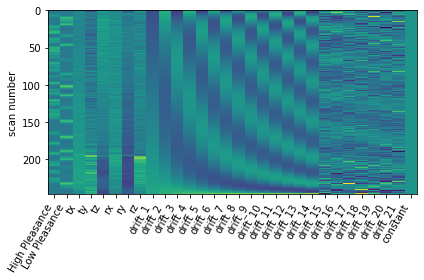

In [21]:
# PARAMETRIC MODULATION EVALUATION ( HERE IT IS ON) ( only on HIGH Pleasantness vs LOW Pleasantness)

hrf_model = 'spm' # no derivative + dispersion for faster computation for the demonstration

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Low_Pleasance',
                          param_modulation= True,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=None,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [22]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))

conditions = {
'high_p': np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0),
'low_p' :np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=1),    
'Task_related':np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0)+np.eye(N=1,M=len(design_mat_01_Faces_ap_cor.columns),k=1),
}



In [23]:
z_map_pl = glm_01_Faces_pa_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')
z_map_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')
# t statistics computed on the statistical map derive from one tailed hypothesis test, to get a full picture of 
#the relative impact of High Pleasance and Low pleasance on voxel activation, one must compute z_map for both tail.
 
z_map_lp_minus_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp_minus_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

In [ ]:
# Global Pleasance 

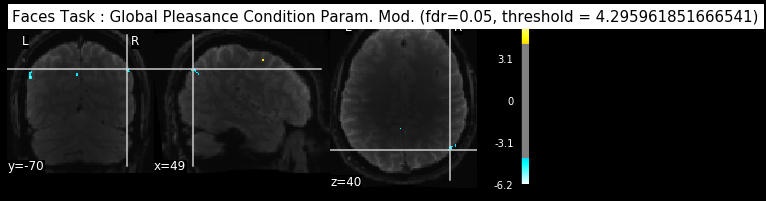

In [39]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

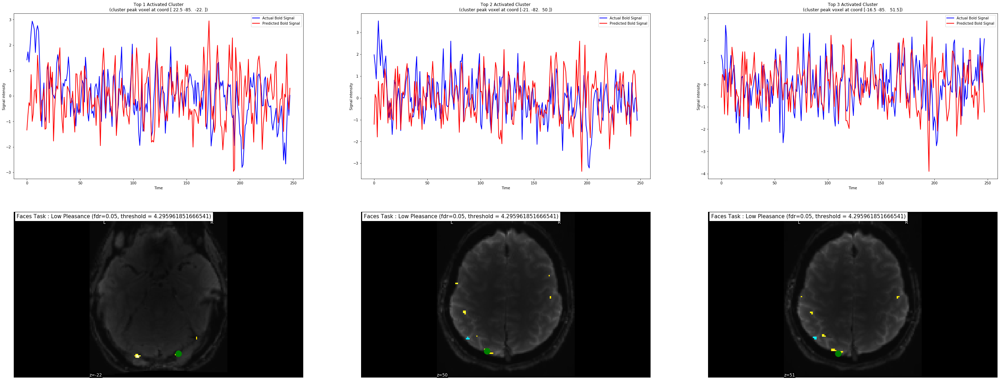

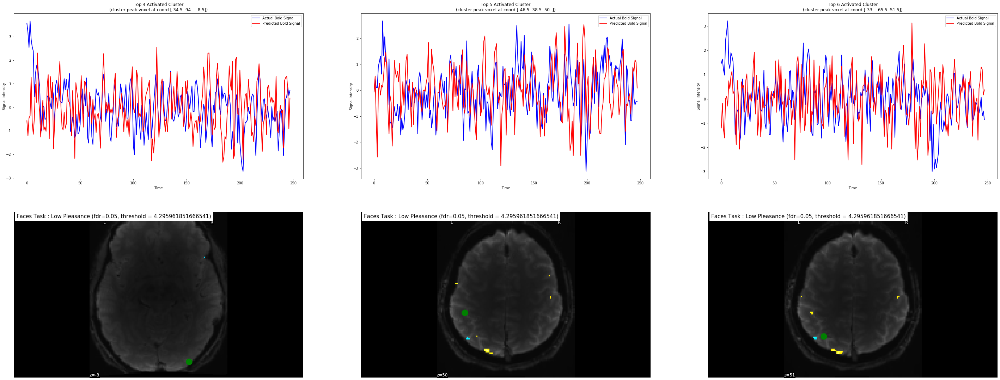

In [43]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_pl,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)
# Bold response fit of GLM for top clusters, localized with the green dot

In [44]:
# High Pleasance

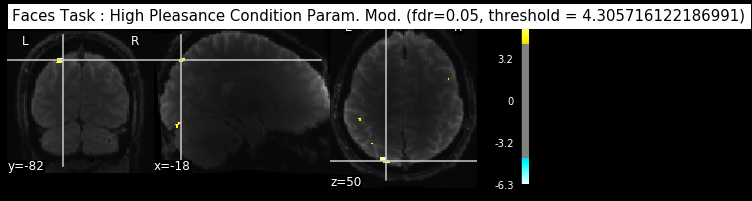

In [45]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

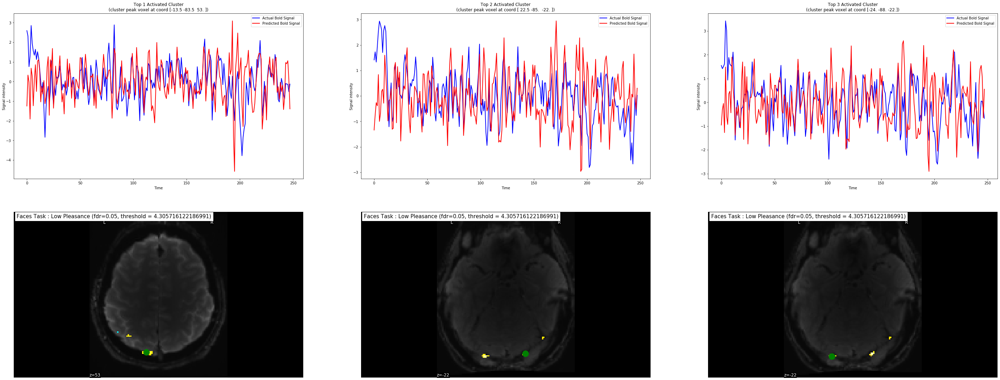

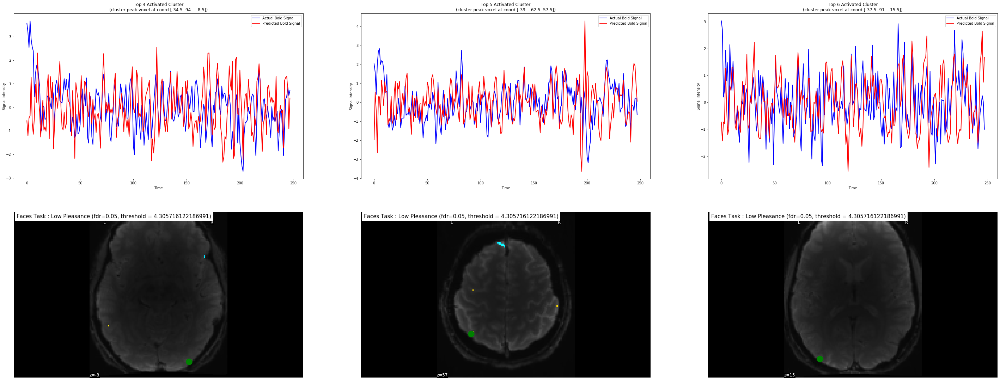

In [47]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )
# Bold response fit of GLM for top clusters, localized with the green dot

In [48]:
# Low Pleasance

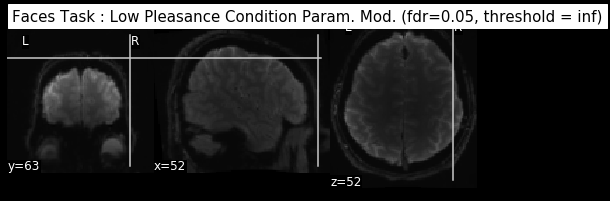

In [49]:
table, threshold = stat_result(z_map=z_map_lp,
                               contrast_name='Low Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
#NO ACTIVATED CLUSTERS
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)

In [ ]:
# High Pleasance - Low Pleasance
# No need as there is No activation for Low P with param mod.

In [ ]:
table, threshold = stat_result(z_map=z_map_hp_minus_lp,
                               contrast_name='Global Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp_minus_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)

In [ ]:
# Low Pleasance - High Pleasance
# No need as there is No activation for Low P with param mod.

In [ ]:
table, threshold = stat_result(z_map=z_map_lp_minus_hp,
                               contrast_name='Global Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp_minus_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
################################################################################################################

Computing run 1 out of 1 runs (go take a coffee, a big one)

Computation of 1 runs done in 216 seconds



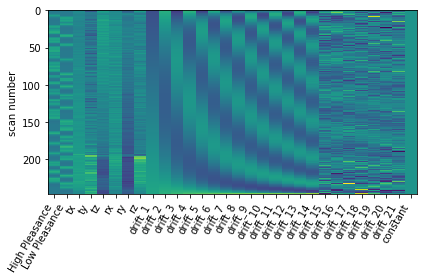

In [12]:
# PARAMETRIC MODULATION EVALUATION ( HERE IT IS OFF) ( only on HIGH Pleasantness vs LOW Pleasantness)

hrf_model = 'spm' # no derivative + dispersion for faster computation for the demonstration

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Low_Pleasance',
                          param_modulation= False,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=None,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [14]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))

conditions = {
'high_p': np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0),
'low_p' :np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=1),    
'Task_related':np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0)+np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=1),
}


In [15]:
z_map_pl = glm_01_Faces_pa_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')
z_map_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')
# t statistics computed on the statistical map derive from one tailed hypothesis test, to get a full picture of 
#the relative impact of High Pleasance and Low pleasance on voxel activation, one must compute z_map for both tail.
 
z_map_lp_minus_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp_minus_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

In [16]:
# Global Pleasance 

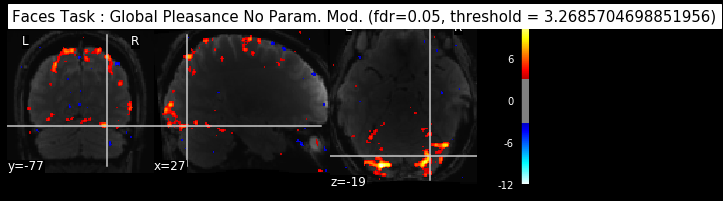

In [17]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

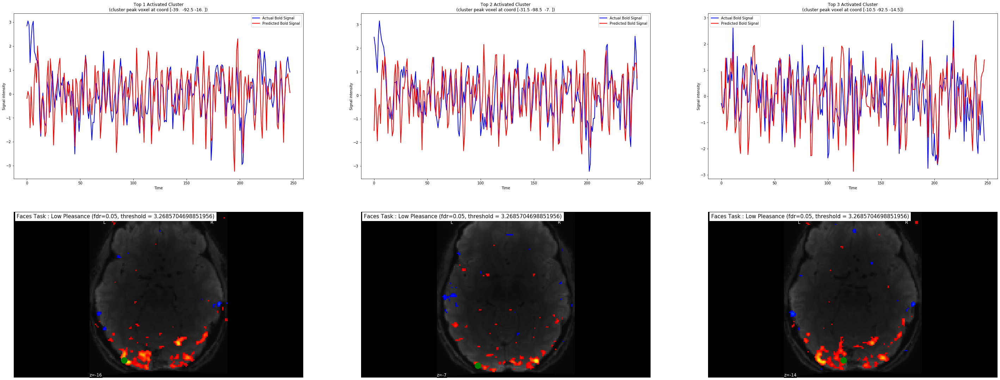

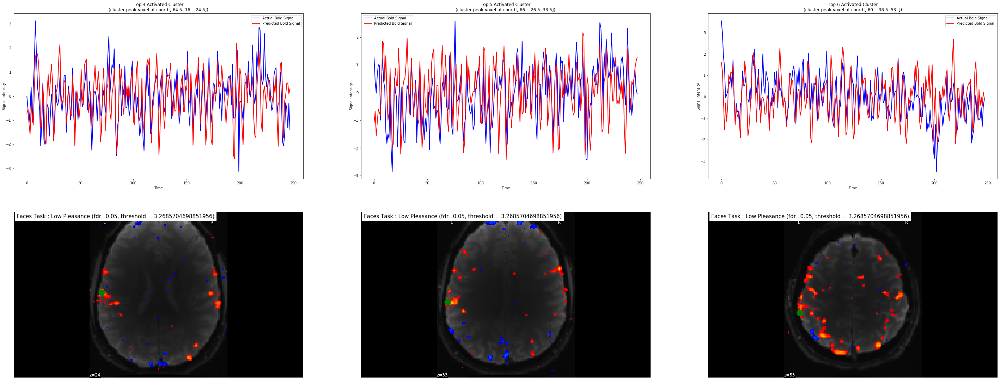

In [18]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_pl,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [19]:
# High Pleasance

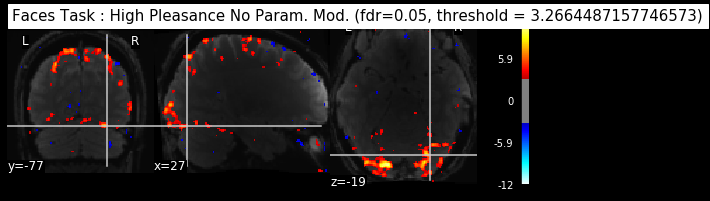

In [21]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

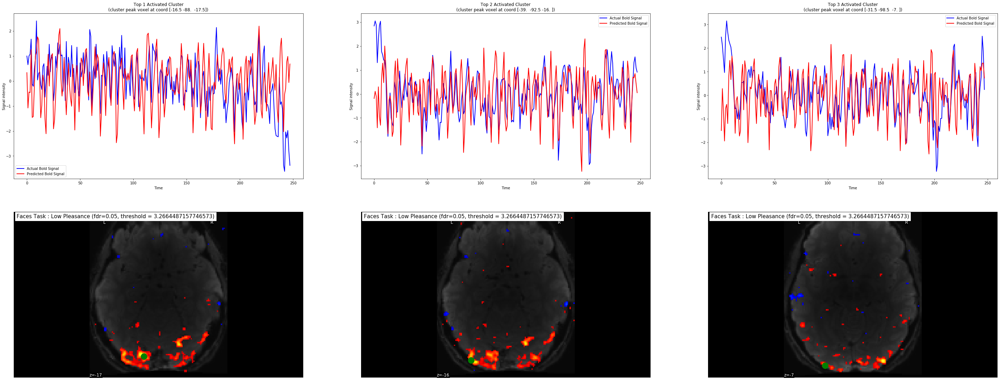

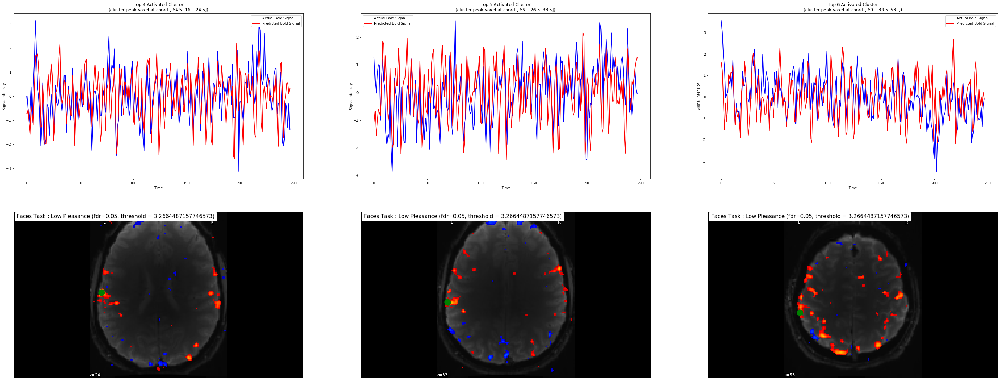

In [22]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [23]:
# Low Pleasance

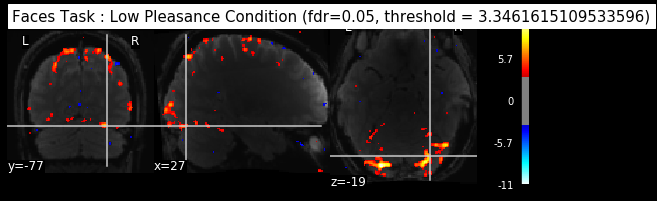

In [24]:
table, threshold = stat_result(z_map=z_map_lp,
                               contrast_name='Low Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

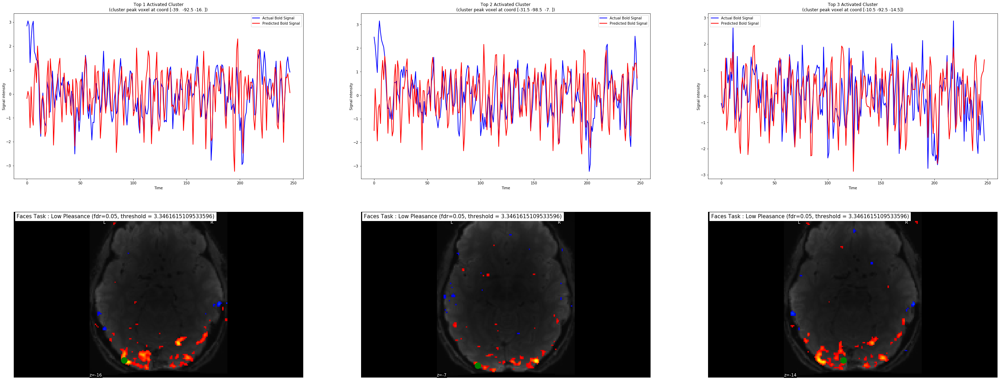

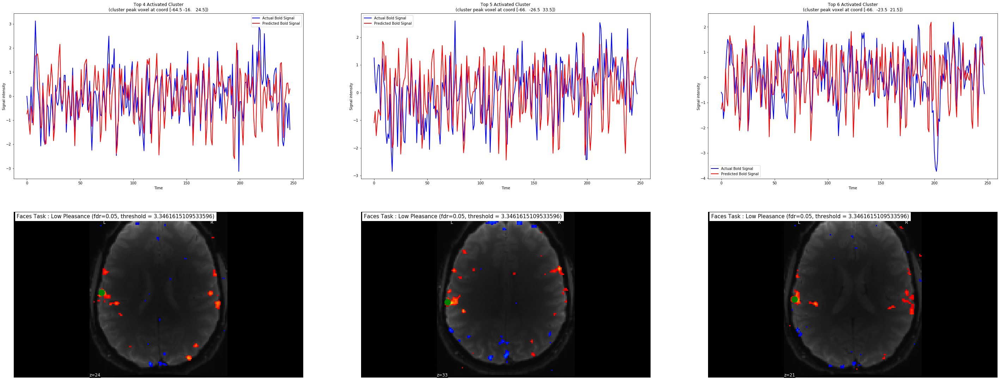

In [25]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [26]:
# High Pleasance - Low Pleasance

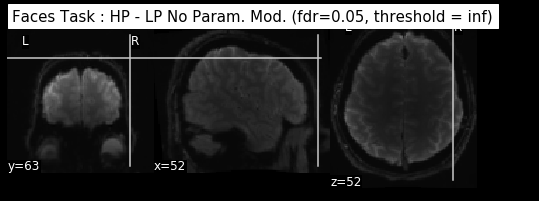

In [28]:
table, threshold = stat_result(z_map=z_map_hp_minus_lp,
                               contrast_name='HP - LP No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp_minus_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)

In [ ]:
# Low Pleasance - High Pleasance

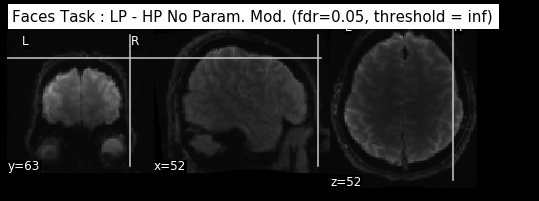

In [29]:
table, threshold = stat_result(z_map=z_map_lp_minus_hp,
                               contrast_name='LP - HP No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp_minus_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
################################################################################################################

Computing run 1 out of 1 runs (go take a coffee, a big one)

Computation of 1 runs done in 217 seconds



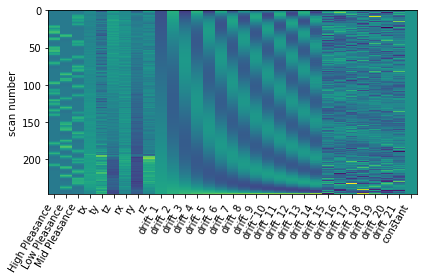

In [30]:
#  HIGH Pleasantness, MID Pleasantness, LOW Pleasantness No Param MOD

hrf_model = 'spm' # no derivative + dispersion for faster computation for the demonstration

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Mid_Low_Pleasance',
                          param_modulation= False,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=None,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [31]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))

conditions = {
'high_p': np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0),
'mid_p' :np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=1),
'low_p' :np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=2),
    
'Task_related':np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0)+np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=1)+np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=2),
}


In [32]:
z_map_pl = glm_01_Faces_pa_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_mp = glm_01_Faces_pa_cor.compute_contrast(conditions['mid_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')



In [33]:
# Global Pleasance 

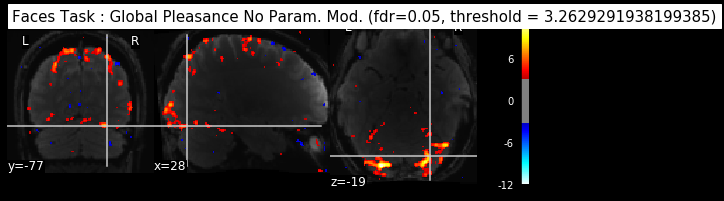

In [34]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

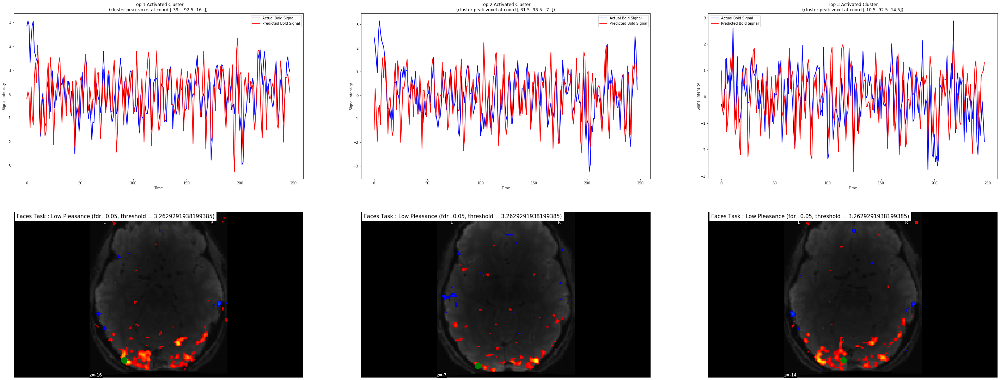

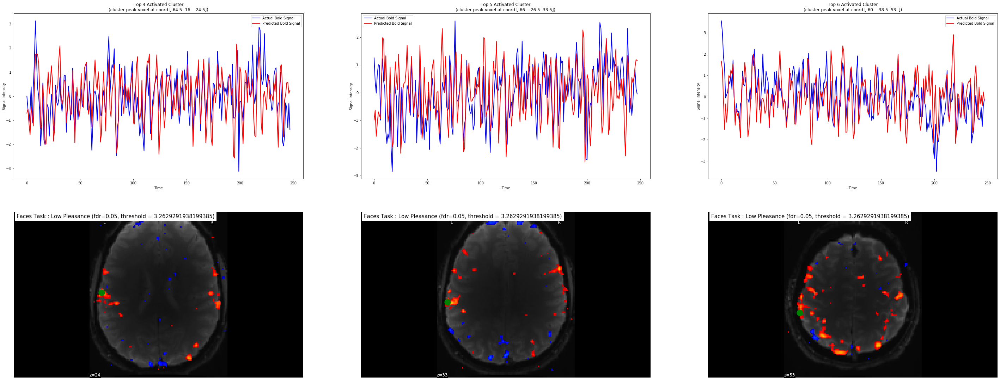

In [35]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_pl,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [36]:
# High Pleasance

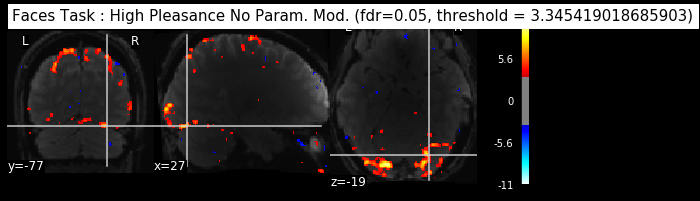

In [37]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

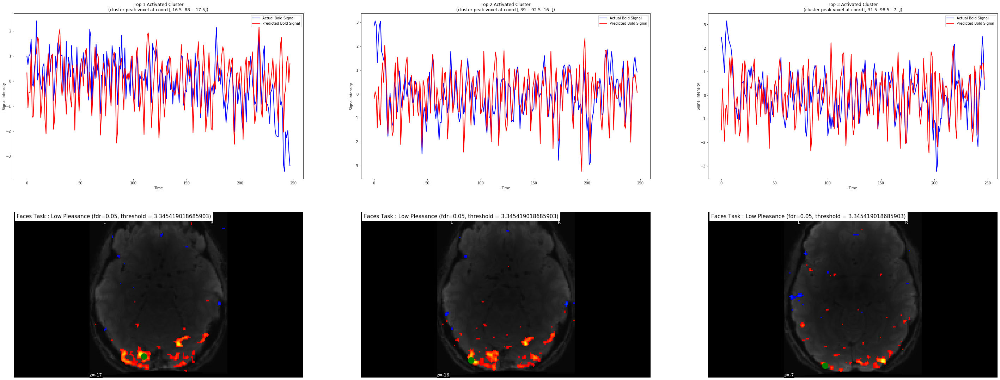

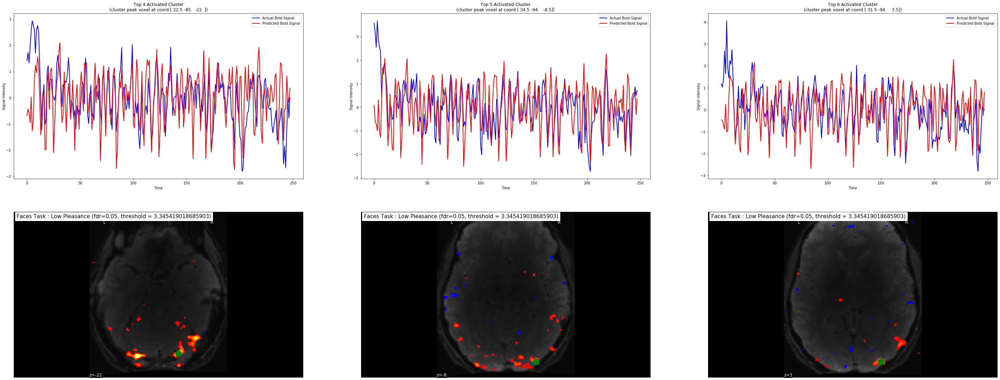

In [38]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [39]:
# Mid Pleasance

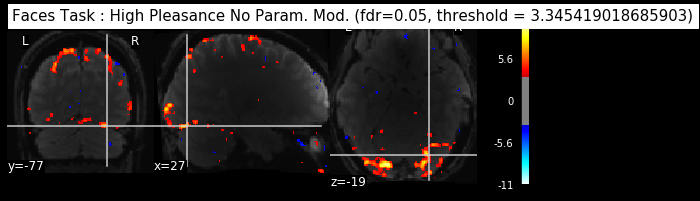

In [40]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

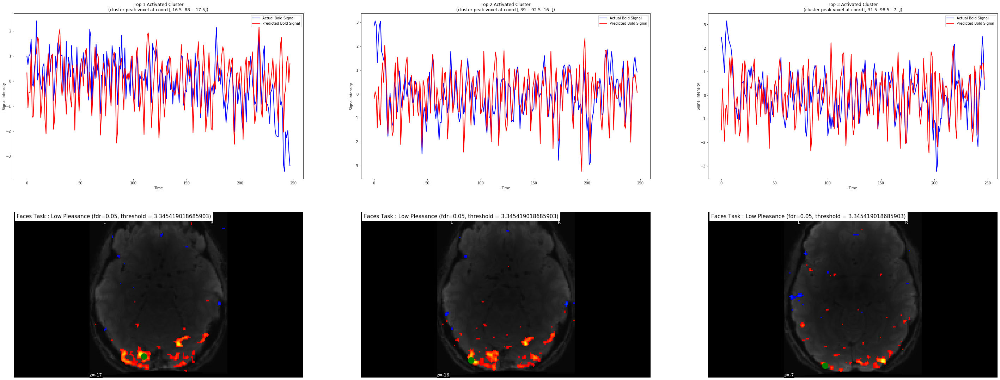

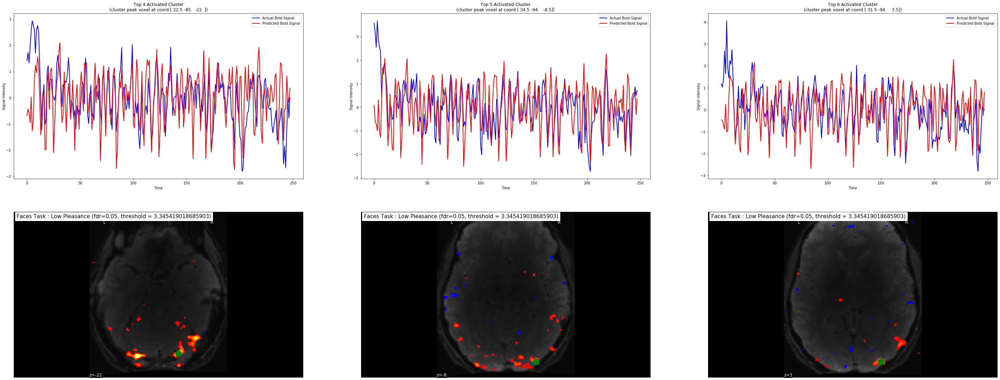

In [41]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [42]:
# Low Pleasance

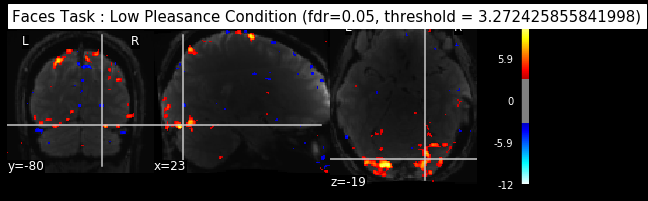

In [43]:
table, threshold = stat_result(z_map=z_map_lp,
                               contrast_name='Low Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

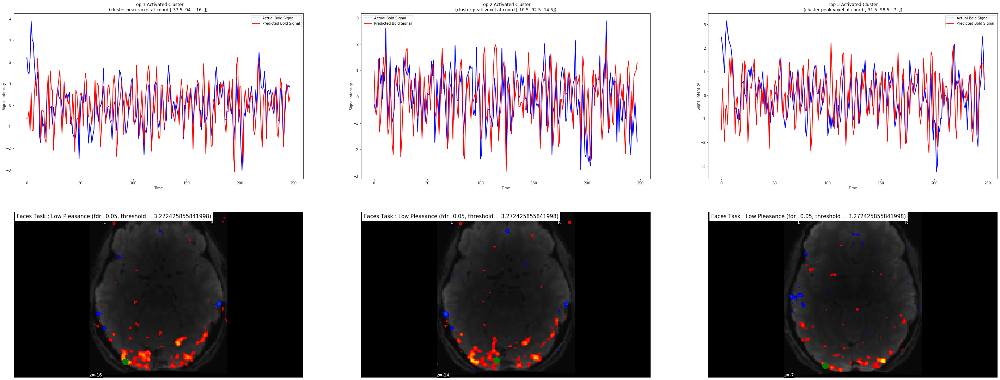

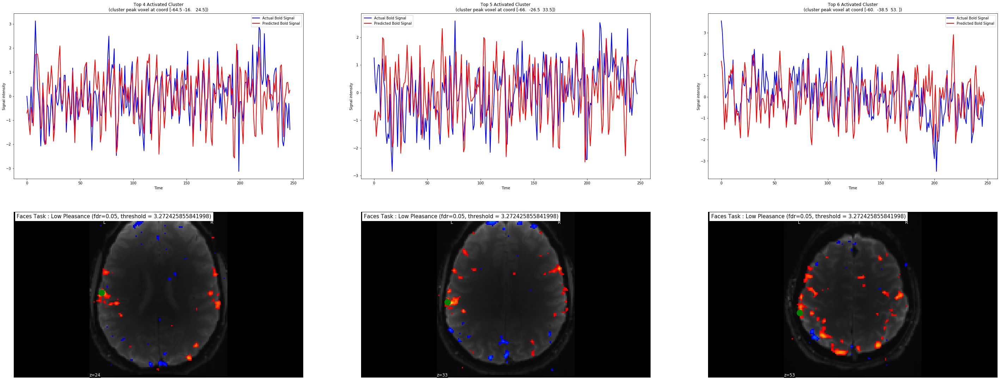

In [44]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

- ######     GLM : Finite Bold Response Method

Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[-101.147606, ..., -100.776985],
       ...,
       [-110.89499 , ..., -104.136185]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
________________________________________________________run_glm - 200.0s, 3.3min



Computation of 1 runs done in 368 seconds



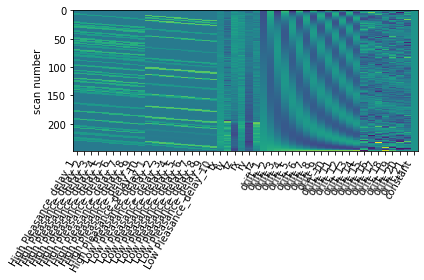

In [12]:
# PARAMETRIC MODULATION EVALUATION ( HERE IT IS ON) ( only on HIGH Pleasantness vs LOW Pleasantness)

hrf_model = 'fir' 
fbr_expected_tr_delay = 10

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Low_Pleasance',
                          param_modulation= True,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=fbr_expected_tr_delay,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [14]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))



s = np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0)
v = np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=10)

for k in range(1,10):
    
    s+= np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=k)

for k in range(11,20):
    
    v+= np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=k)


conditions = {
'high_p': s,
'low_p' :v,    
'Task_related': s+v
}



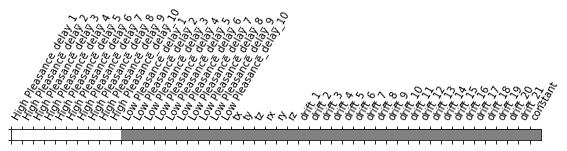

In [16]:
plot_contrast_matrix(s,design_mat_01_Faces_pa_cor)

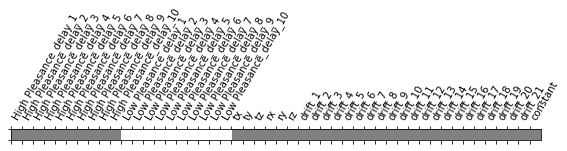

In [17]:
plot_contrast_matrix(v,design_mat_01_Faces_pa_cor)

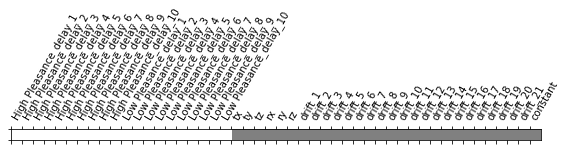

In [18]:
plot_contrast_matrix(s+v,design_mat_01_Faces_pa_cor)

In [19]:
z_map_pl = glm_01_Faces_pa_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')
z_map_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')
# t statistics computed on the statistical map derive from one tailed hypothesis test, to get a full picture of 
#the relative impact of High Pleasance and Low pleasance on voxel activation, one must compute z_map for both tail.
 
z_map_lp_minus_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp_minus_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

In [20]:
# Global Pleasance 

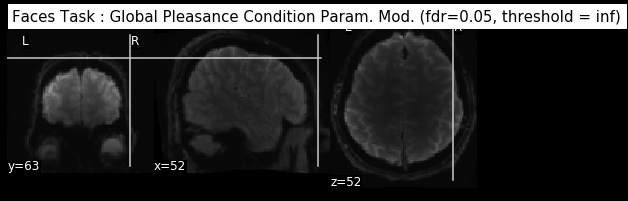

In [21]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_pl,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)
# Bold response fit of GLM for top clusters, localized with the green dot

In [23]:
# High Pleasance

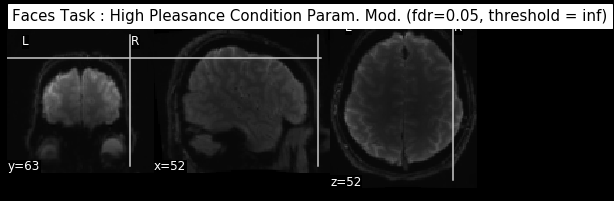

In [24]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )
# Bold response fit of GLM for top clusters, localized with the green dot

In [48]:
# Low Pleasance

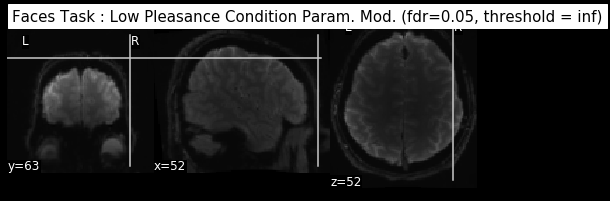

In [25]:
table, threshold = stat_result(z_map=z_map_lp,
                               contrast_name='Low Pleasance Condition Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
#NO ACTIVATED CLUSTERS
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)

In [ ]:
################################################################################################################

Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[-101.147606, ..., -100.776985],
       ...,
       [-110.89499 , ..., -104.136185]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
________________________________________________________run_glm - 177.5s, 3.0min



Computation of 1 runs done in 342 seconds



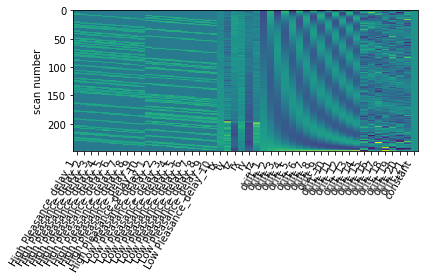

In [28]:
# PARAMETRIC MODULATION EVALUATION ( HERE IT IS OFF) ( only on HIGH Pleasantness vs LOW Pleasantness)

hrf_model = 'fir' 
fbr_expected_tr_delay = 10

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Low_Pleasance',
                          param_modulation= False,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=fbr_expected_tr_delay,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

In [29]:
# Z_map processings

data = image.load_img(data_path)
m_img = mean_img(image.load_img(data_path))



s = np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=0)
v = np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=10)

for k in range(1,10):
    
    s+= np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=k)

for k in range(11,20):
    
    v+= np.eye(N=1,M=len(design_mat_01_Faces_pa_cor.columns),k=k)


conditions = {
'high_p': s,
'low_p' :v,    
'Task_related': s+v
}



In [30]:
z_map_pl = glm_01_Faces_pa_cor.compute_contrast(conditions['Task_related'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')
z_map_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'],
                                  stat_type='t',
                                  output_type='z_score')
# t statistics computed on the statistical map derive from one tailed hypothesis test, to get a full picture of 
#the relative impact of High Pleasance and Low pleasance on voxel activation, one must compute z_map for both tail.
 
z_map_lp_minus_hp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

z_map_hp_minus_lp = glm_01_Faces_pa_cor.compute_contrast(conditions['low_p'] - conditions['high_p'],
                                  stat_type='t',
                                  output_type='z_score')

In [31]:
# Global Pleasance 

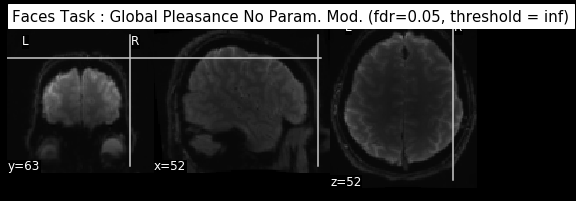

In [32]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_pl,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
# High Pleasance

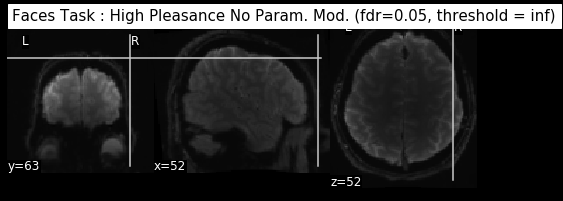

In [34]:
table, threshold = stat_result(z_map=z_map_hp,
                               contrast_name='High Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
# Low Pleasance

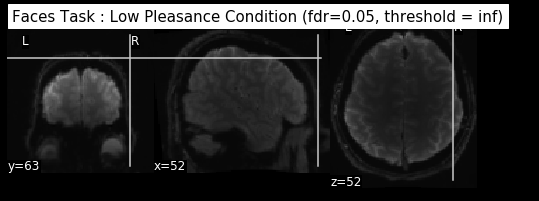

In [35]:
table, threshold = stat_result(z_map=z_map_lp,
                               contrast_name='Low Pleasance Condition',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
# High Pleasance - Low Pleasance

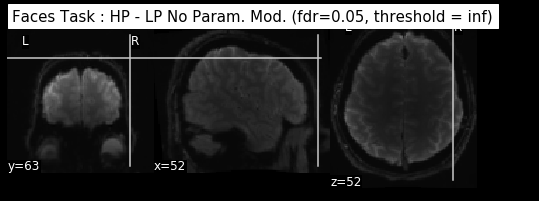

In [36]:
table, threshold = stat_result(z_map=z_map_hp_minus_lp,
                               contrast_name='HP - LP No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_hp_minus_lp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img)

In [ ]:
# Low Pleasance - High Pleasance

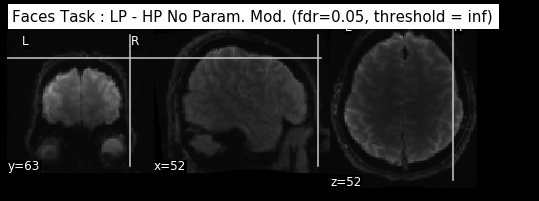

In [37]:
table, threshold = stat_result(z_map=z_map_lp_minus_hp,
                               contrast_name='LP - HP No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

In [ ]:
top_cluster_stat_results(data=data,task=task,glm=glm_01_Faces_pa_cor,z_map=z_map_lp_minus_hp,
                         threshold=threshold,
                         table=table,
                         bg_img=m_img,
                         )

In [ ]:
################################################################################################################

Computing run 1 out of 1 runs (go take a coffee, a big one)

Computation of 1 runs done in 217 seconds



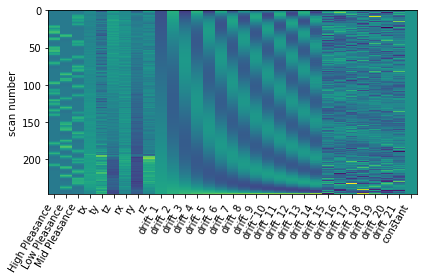

In [30]:
#  HIGH Pleasantness, MID Pleasantness, LOW Pleasantness No Param MOD

hrf_model = 'spm' # no derivative + dispersion for faster computation for the demonstration

drift_model = 'polynomial'

drift_order = 21

glm_01_Faces_pa_cor, design_mat_01_Faces_pa_cor = compute_core_fmri_glm(
                          task = task,
                          data_path = data_path,
                          events_path = events_path,
                          motion_param_path = motion_param_path,
                          cache_mem_path = cache_mem_path,
                          analysis_type = 'High_Mid_Low_Pleasance',
                          param_modulation= False,
                          t_r=t_r,
                          hrf_model=hrf_model,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=None,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=None,
                          slice_time_ref=None,
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=smoothing_fwhm,
                          standardize=True,
                          detrend=True,minimize_memory=False
)

# SAME RESULT AS PRECEDENTLY

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Food Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Paintings Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### House Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

## Subject 4

### Face Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Food Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Paintings Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### House Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

## Subject 5

### Face Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Food Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Paintings Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### House Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

## Subject 6

### Face Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Food Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### Paintings Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

### House Task

#### Run 1 AP 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Run 2 PA 

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

#### Consolidated Runs

##### Slice Timing Corrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

##### Slice Timing Uncorrected Input Data

- ######     GLM : Correlation Method

- ######     GLM : Finite Bold Response Method

# Second Level Analysis

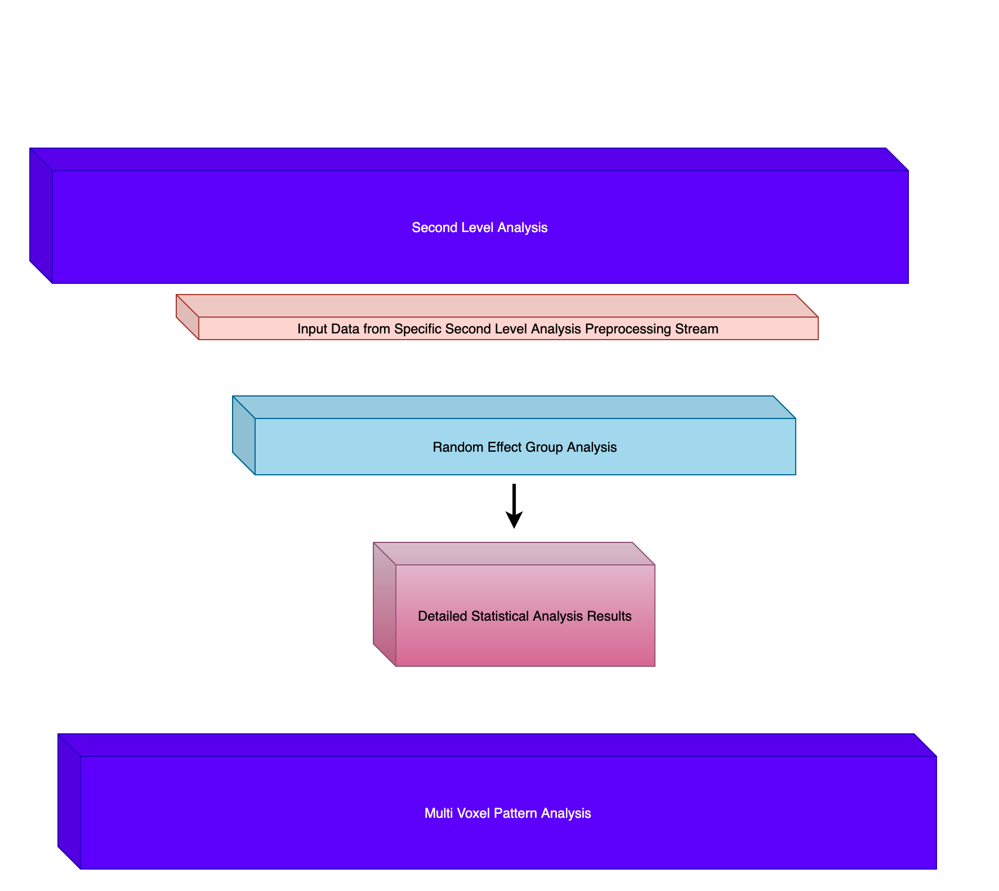